# Computer Vision - Assignment 3 - Feature Extraction and Image Stitching

#### 10 points   |   Due date: December 31, 23:59   |   Submission site: https://pradogrado2324.ugr.es/

### Student's Full Name: <mark>ALEJANDRO NIETO ALARCON</mark>



<font color='blue'>In this assignment you will learn:

<font color='blue'>a) to detect interest points using the Harris Corner Detector (Exercise 2) and a multi-scale approach to detect blobs using the Laplacian of Gaussian (Exercise 1).

<font color='blue'>b) to find correspondences between the keypoints from two images using descriptors (SIFT and Haralick) (Exercise 3).

<font color='blue'>c) to compose a rectangular mosaic/panorama from a bunch of images using homographies (Exercise 4).

In [7]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
%cd '/content/drive/My Drive'
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [8]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [9]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [10]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [11]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [12]:
# Here you include your functions from P1 to compute derivatives and convolution

def GaussFunc(x,sigma):
    return np.exp(-1*x**2/(2*sigma**2))

def GaussDeriv1Func(x,sigma):
    return -x/(sigma**2)*GaussFunc(x,sigma)

def GaussDeriv2Func(x,sigma):
    return (x**2/sigma**4 - 1/sigma**2)*GaussFunc(x,sigma)

def gaussianMask1D(sigma=0, sizeMask=0, order=0):

    if sigma != 0 and sizeMask == 0:
      sizeMask = int(2 * 3 * sigma + 1)

      if sizeMask % 2 == 0: sizeMask += 1
    if sigma == 0 and sizeMask != 0:
      sigma = (sizeMask - 1) / (2*3)

    k = 3 * sigma

    #print("Sizemask --> ", sizeMask)

    if order == 0:
      mask = GaussFunc(np.linspace(-k,k,sizeMask), sigma)
      mask = mask / mask.sum()

    elif order == 1:
      mask = GaussDeriv1Func(np.linspace(-k,k,sizeMask), sigma)
      mask = mask * (sigma)
    elif order == 2:
      mask = GaussDeriv2Func(np.linspace(-k,k,sizeMask), sigma)
      mask = mask * (sigma**2)

    return mask

def my2DConv(im, sigma, orders):
  ddepth=cv2.CV_64F

  maskG=gaussianMask1D(sigma=sigma, order=0)
  maskDG=gaussianMask1D(sigma=sigma, order=1)
  mask2DG= gaussianMask1D(sigma=sigma, order=2)

  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im,ddepth,maskG,maskG)

  elif orders!=[0,0]:

    if orders==[0,1]:
      return cv2.sepFilter2D(im,ddepth,maskG,maskDG)
    elif orders==[0,2]:
      return cv2.sepFilter2D(im,ddepth,maskG,mask2DG)
    elif orders==[1,0]:
      return cv2.sepFilter2D(im,ddepth,maskDG,maskG)
    elif orders==[2,0]:
      return cv2.sepFilter2D(im,ddepth,mask2DG,maskG)
    elif orders == [2,2]:
      return cv2.sepFilter2D(im, ddepth, mask2DG, mask2DG)
  else:
    print('error in order of derivative')

# <font color='blue'>**Exercise 1:** Multi-scale blob detection using the Laplacian of Gaussian (2 points)

<font color='blue'> Students must implement a multiscale blob detector in Python that, based on successive applications of Laplacian of Gaussian (LoG) filters, allows them to identify interest points/regions. The process to follow is detailed below:

> <font color='blue'>1) use the following sigmas to create the corresponding scales: 11 values starting from $\sigma_0 = 0.5$ and increase $\sigma$ by a factor of 1.5. In other words, $\sigma=[0.5, 0.75, 1.125, 1.687, 2.531, 3.796, 5.695, 8.542, 12.814, 19.221, 28.832]$. Remember to convolve the image with scale-normalized LoG.

> <font color='blue'>2) Find maxima of squared Laplacian response in scale-space. Select the local maximum corresponding to a neighborhood $3\times3\times3$, where the central pixel of this volume would be the position to evaluate. That is, each pixel is compared with its 26 neighbors and saved if it is a maximum. The function `maximum_filter` from `scipy.ndimage` may be useful here. Along with this, also use a $\textit{threshold}$ to limit the number of blobs detected to around 1000 points.

> <font color='blue'>3) Draw the detected blobs as circles centered on the identified Cartesian coordinates, and radius proportional to the scale at which the corresponding blob was detected.

<font color='blue'>The process is visually shown on slide 63 of https://pradogrado2324.ugr.es/pluginfile.php/234073/mod_folder/content/0/3.3.BoW_Blobs.pdf

Lo que vamos a hacer a continuacion es la implementación del Blob Detector pero ¿por qué usaríamos esto en vision por computador?. Tenemos que recordar que los filtros dan una fuerte respuesta a pratones a los que se parecen, por eso es que usamos LoG para implementar esto.

Lo que haremos en primer lugar es buscar a diferentes escalas de la imagen cuando el filtro dá máxima respuesta que es lo que nos interesa. Un filtro LoG da máxima respuesta cuando los ceros de la Laplaciana están alineados con el circulo o en este caso el blob.

Para esto debemos en primer lugar obtener la Laplaciana de la imagen para distintos sigmas, lo elevaremos al cuadrado para que los máximos sean todavía más máximos y eliminar numeros negativos, una vez ya conseguida la piramide de estas imágenes a distintas escalas lo que haremos será aplicar maximun_filter que nos buscará donde estan los máximos para un kernel 3x3x3. (Es por eso que nuestra piramide la ponemos con dstack para almacenar una matriz del tipo widthxheightxsigmas)

Una vez obtenido con argwhere donde se encuentran localizadas las posiciones de los máximos simplemente tenemos que guardar las coordenadas y el sigma donde se encontró para después mostrarlo en el gráfico.

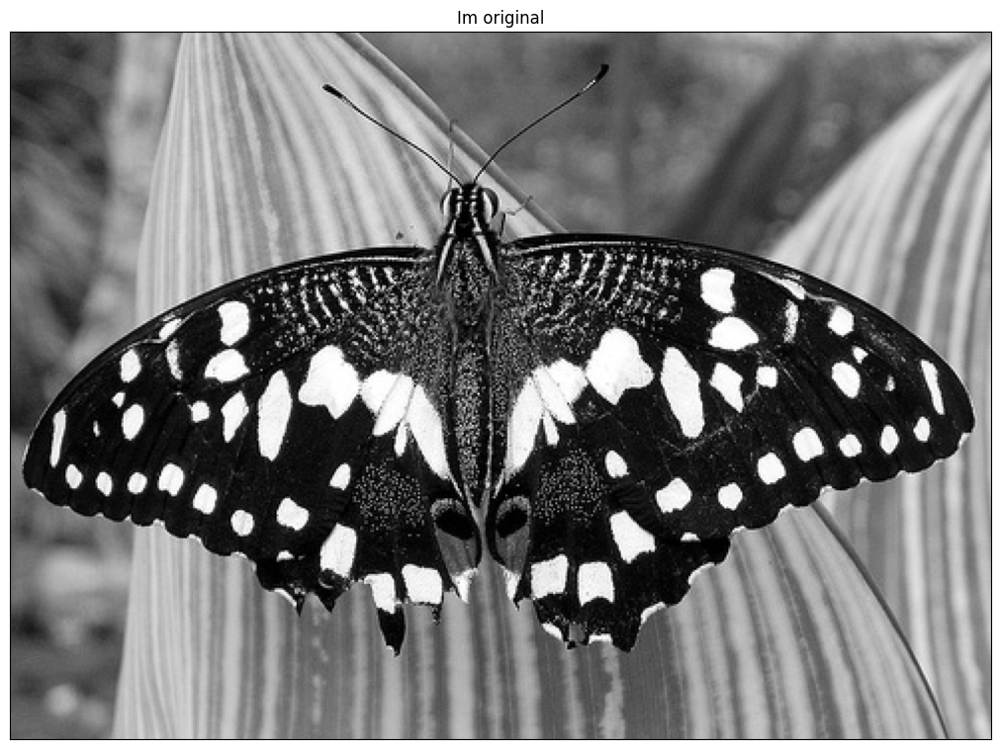

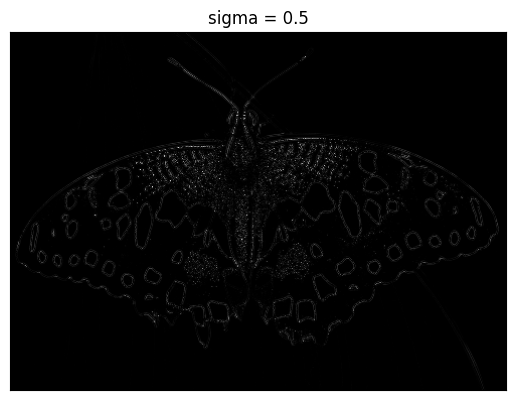

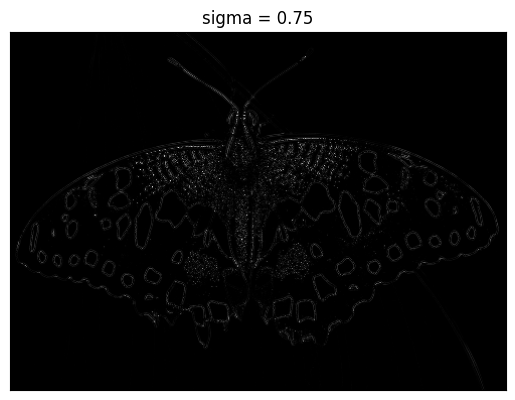

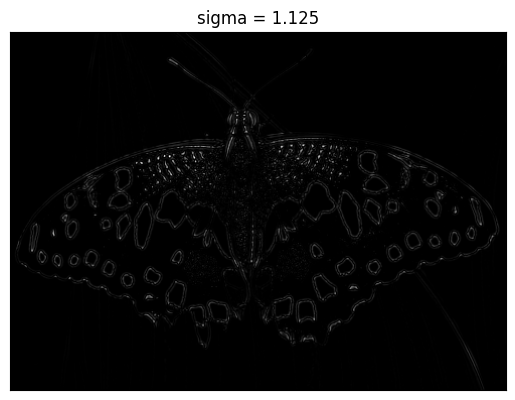

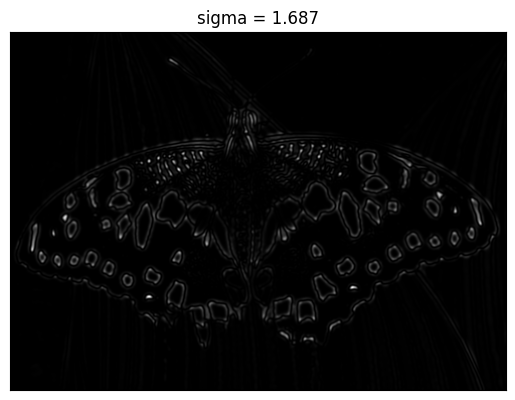

...

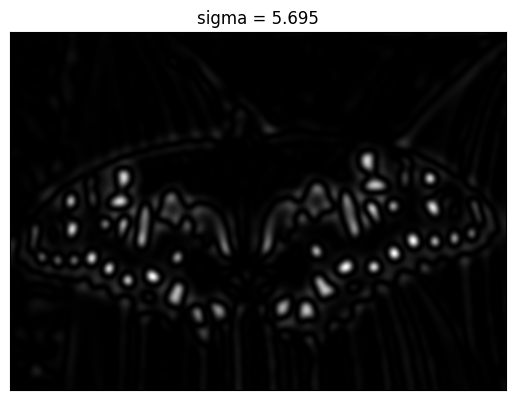

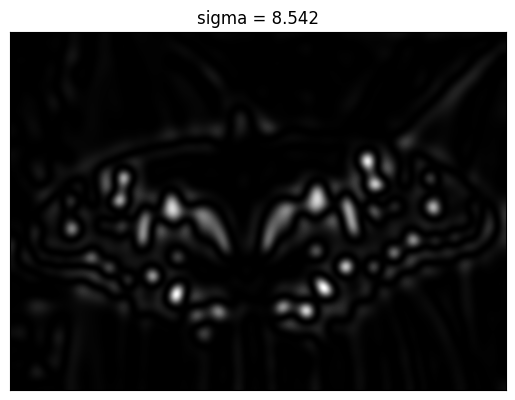

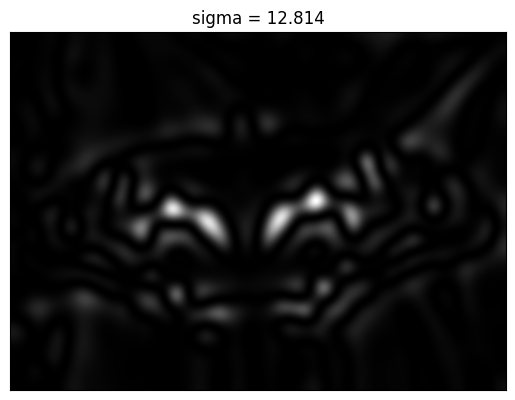

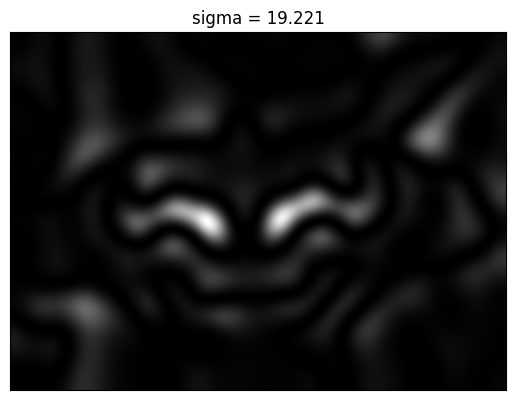

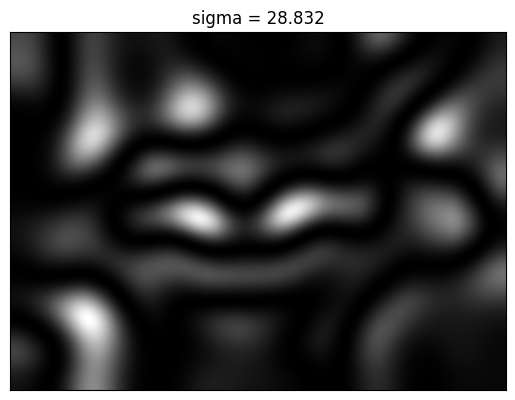

Total keypoints =  560


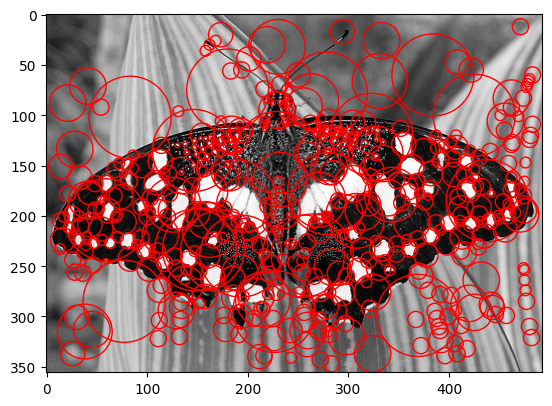

In [13]:
from scipy.ndimage import maximum_filter

def draw_blobs(image, blob_coordinates):
    plt.imshow(image, cmap='gray')
    ax = plt.gca()

    for blob in blob_coordinates:
        y, x, sigma = blob
        radius = sigma * np.sqrt(2)  # Radius proportional to the scale
        #quitar circulos que se salgan
        if (x + radius < image.shape[1] and x - radius > 0) and (y + radius < image.shape[0] and y - radius > 0):
          circle = plt.Circle((x, y), radius, color='r', fill=False)
          ax.add_patch(circle)

    plt.show()



def calculate_blobs(im, sigmas, debug = 0):

  scale_space = np.empty(im.shape)

  blob_coordinates = []


  for sigma in sigmas:

    lap = my2DConv(im,sigma,[0,2]) + my2DConv(im,sigma,[2,0])
    squared_response = lap ** 2
    scale_space = np.dstack((scale_space, squared_response))

    if debug == 1:
      displayIm(squared_response, "sigma = " + str(sigma) , 1)

      #plt.imshow(squared_response, cmap='gray')
      #ax = plt.gca()
      #plt.show()


  scale_space = scale_space[:,:,1:]
  local_maxima = maximum_filter(scale_space, size=(3,3,3))

  threshold = np.max(local_maxima) * 0.004
  for i in range(local_maxima.shape[2]):

    coordinates = np.argwhere((scale_space[:,:,i] == local_maxima[:,:,i]) & (local_maxima[:,:,i] > threshold))
    for coord in coordinates:
      x = coord[1]
      y = coord[0]
      blob_coordinates.append([y,x,sigmas[i]])

  print("Total keypoints = ", len(blob_coordinates))

  return blob_coordinates

im=readIm(get_image('butterfly.jpg'),0)
sigmas = [0.5,0.75,1.125,1.687,2.531,3.796,5.695,8.542,12.814,19.221,28.832]
displayIm(im, "Im original", 2)

blob_coordinates = calculate_blobs(im, sigmas, 1)
draw_blobs(im, blob_coordinates)




Tras la ejecución del código y una vez con el gráfico bien hecho podemos ver que es cierto que muchos de los puntos clave los detecta bien pero que hay muchos otros que no está muy claro el por qué da ese punto.( Puntos de grande escala sobre las hojas donde no debería haber ningun punto ya que no es una región de interés)

**Ventajas**:

* Robustez ante cambios de iluminación: Los algoritmos de detección de blobs a menudo son robustos frente a cambios en la iluminación, ya que se centran en propiedades locales de la imagen.

* Procesamiento eficiente: Muchos algoritmos de detección de blobs son computacionalmente eficientes, lo que facilita su implementación en tiempo real o en entornos con recursos limitados. (Aunque en este caso hemos usado muchos sigmas diferentes, sigue siendo bastante rápido)

**Desventajas**:

* Sensibilidad a la escala: Algunos algoritmos de detección de blobs pueden ser sensibles a cambios en la escala de los objetos. Esto puede hacer que sea necesario ajustar parámetros para diferentes tamaños de blobs.

* Ruido y falsos positivos: En entornos con mucho ruido o en presencia de patrones que puedan confundirse con blobs, es posible obtener falsos positivos. Esto puede requerir técnicas adicionales para filtrar o corregir estos errores.

* Dependencia del color o contraste: Algunos métodos de detección de blobs pueden depender del contraste o de la información de color en la imagen. Esto puede ser una desventaja si la iluminación es inconsistente o si la escena presenta poca variación de color.


# <font color='blue'>**Exercise 2:** Harris Corner Detector (3 points)

<font color='blue'>Write the Python code necessary to implement the detection of the stronger 100-150 Harris points in an image. The steps to implement the Harris corner detector are the following: \


> <font color='blue'>a) Set the derivative ($\sigma_D$) and integration scales ($\sigma_I$) to 1.5 and 2.25, respectively. Other sigma values can also be employed if the student considers that it improves performance.



> <font color='blue'>b) Compute the image derivatives.

> <font color='blue'>c) Compute the three terms of the second moment matrix ($SMM$) at each pixel. To do it, apply convolution with a Gaussian mask with $\sigma_I$.

> <font color='blue'>d) Compute the Harris value at each pixel of the image (discard pixels/points close to the edges).

> <font color='blue'>e) Apply Non-Maxima Suppression by using the function `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) from the module `skimage.features`. The student must select a suitable `min_distance` (`minimal allowed distance separating peaks`), and a suitable response threshold in the Harris Map to just keep the number of keypoints we need (100-150). The output will be a list of $(x,y)$ coordinates. Extract the values in these coordinates and create a list of vectors $(x,y,value)$.

> <font color='blue'>f) Compute the main orientation for each point. This is done by smoothing both derivative images with a sufficiently large sigma ($\sigma=3$) and computing the orientation of the gradient at those points.

> <font color='blue'>d) Create a list of KeyPoints using the selected points. A KeyPoint is a vector including $(x,y,scale,orientation)$. A KeyPoint is an OpenCV's structure (`cv2.KeyPoint`), associated to each detected region,  necessary to call OpenCV feature extractor algorithms.

> <font color='blue'>e) Draw the keypoints on the image using the function `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), and flags `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.


El detector de esquinas Harris que vamos a implementar a continuación es un algoritmo utilizado en visión por computador para identificar esquinas en imágenes. Este algoritmo se basa en el cálculo de la función de esquinas, que evalúa las variaciones locales en la intensidad de la imagen. Para ello deberemos resolver la matriz Hessiana.

**Ventajas**:

* Robustez ante cambios de iluminación: El detector de esquinas de Harris es relativamente robusto ante cambios de iluminación en comparación con otros métodos de detección de características.

* Alta precisión en esquinas: Harris tiende a proporcionar resultados precisos en la detección de esquinas, lo que lo hace útil en aplicaciones como la correspondencia de puntos y el seguimiento de objetos.

* Invarianza a la escala: Harris puede ser adaptado para ser invariante a la escala, lo que significa que puede detectar esquinas independientemente de su tamaño en la imagen.

**Desventajas**:

* Sensibilidad al ruido: El detector de esquinas de Harris puede ser sensible al ruido en la imagen, lo que puede conducir a la detección de esquinas falsas o imprecisas en presencia de ruido significativo.

* Dependencia del parámetro k: La elección del parámetro k puede afectar la sensibilidad del detector y puede requerir ajustes para diferentes tipos de imágenes.

* No es robusto ante rotación: El detector de esquinas de Harris no es intrínsecamente invariante a la rotación, lo que significa que puede no funcionar tan bien en imágenes rotadas.

In [14]:
def derivatives(im, sigmaD):
    im = im.astype(np.float32)

    dx = my2DConv(im, sigmaD, [1,0])
    dy = my2DConv(im, sigmaD, [0,1])

    return dx, dy


def HarrisMap(dx, dy, sigmaI):
    edge_threshold = 0.1

    Ixx = dx**2
    Iyy = dy**2
    Ixy = dx * dy


    Ixx_smoothed = my2DConv(Ixx, sigmaI, [0, 0])
    Iyy_smoothed = my2DConv(Iyy, sigmaI, [0, 0])
    Ixy_smoothed = my2DConv(Ixy, sigmaI, [0, 0])

    detM = (Ixx_smoothed * Iyy_smoothed) - (Ixy_smoothed**2)
    traceM = Ixx_smoothed + Iyy_smoothed
    harrisMap = detM / (traceM)

    harrisMap[harrisMap < edge_threshold] = 0

    return harrisMap

Basicamente en la funcion anterior *HarrisMap* lo que hacemos es calcular cada unos de los miembros de la matriz Hessiana mencionada anteriormente y resolver la formula.


Lo que hacemos a continuacion es usar *corner_peaks* ya que la función corner_peaks se utiliza para encontrar las ubicaciones de los máximos locales en una matriz de esquinas. En otras palabras, dada una matriz que representa una medida de esquinas (la matriz que hemos resuelto anteriormente (la matriz de Harris)), la función corner_peaks identifica las posiciones en la matriz donde se encuentran los máximos locales.

In [15]:
def NonMaximaSuppression(harrisMap, min_distance, threshold):
  points = corner_peaks(harrisMap, min_distance, threshold_rel=threshold)

  coord = np.array(points)
  values = harrisMap[points[:, 0], points[:, 1]]

  thresholded_map = np.zeros_like(harrisMap)
  thresholded_map[coord[:, 0], coord[:, 1]] = values
  displayIm(thresholded_map, title='Harris map thresholded',factor= 2)

  return coord, values

In [16]:
def orientation(dx,dy):

  dx = my2DConv(dx, 3, [0,0])
  dy = my2DConv(dy, 3, [0,0])

  theta = np.arctan2(dy, dx) * (180 / np.pi)
  return theta

def keyPoints(coord,theta,size):
  keyPoints = []

  for i in range(len(coord)):
      y, x = coord[i]
      angle = theta[y, x]
      keyPoints.append(cv2.KeyPoint(x=float(x), y=float(y), size=size, angle=angle))

  return keyPoints


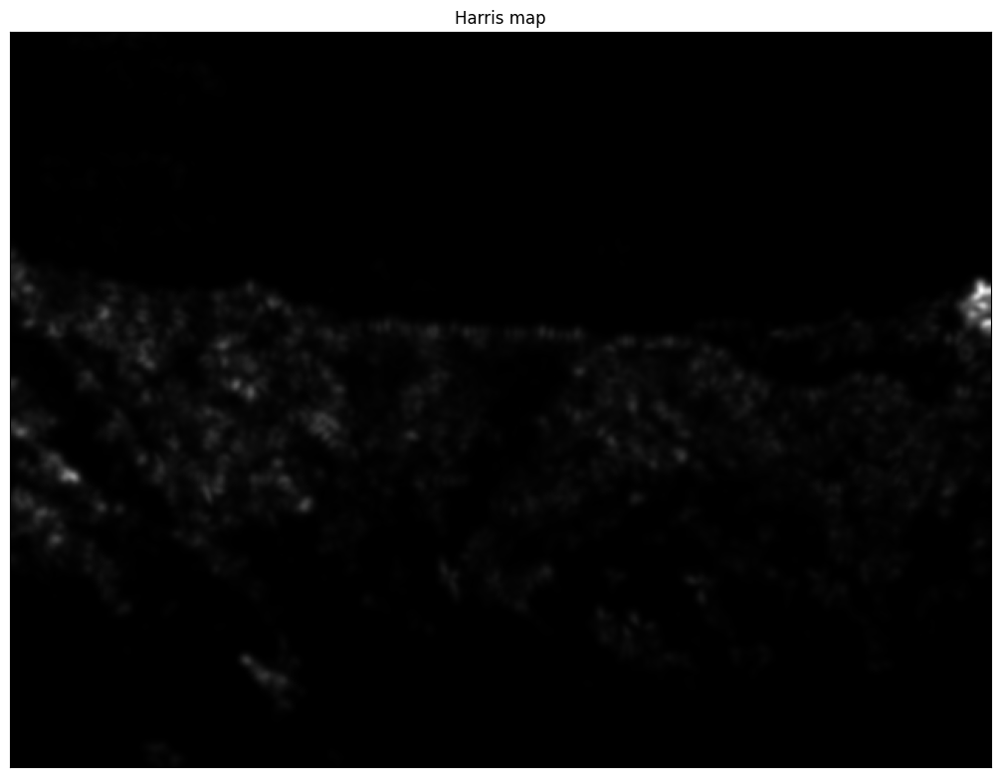

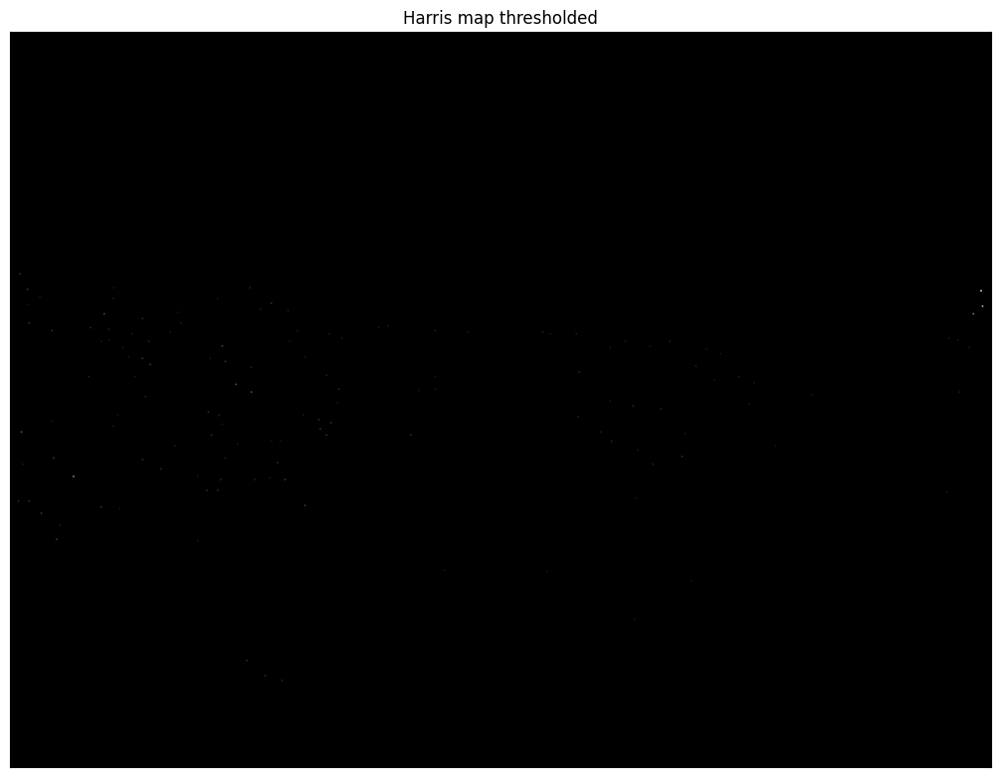

Total number of keypoints: 136


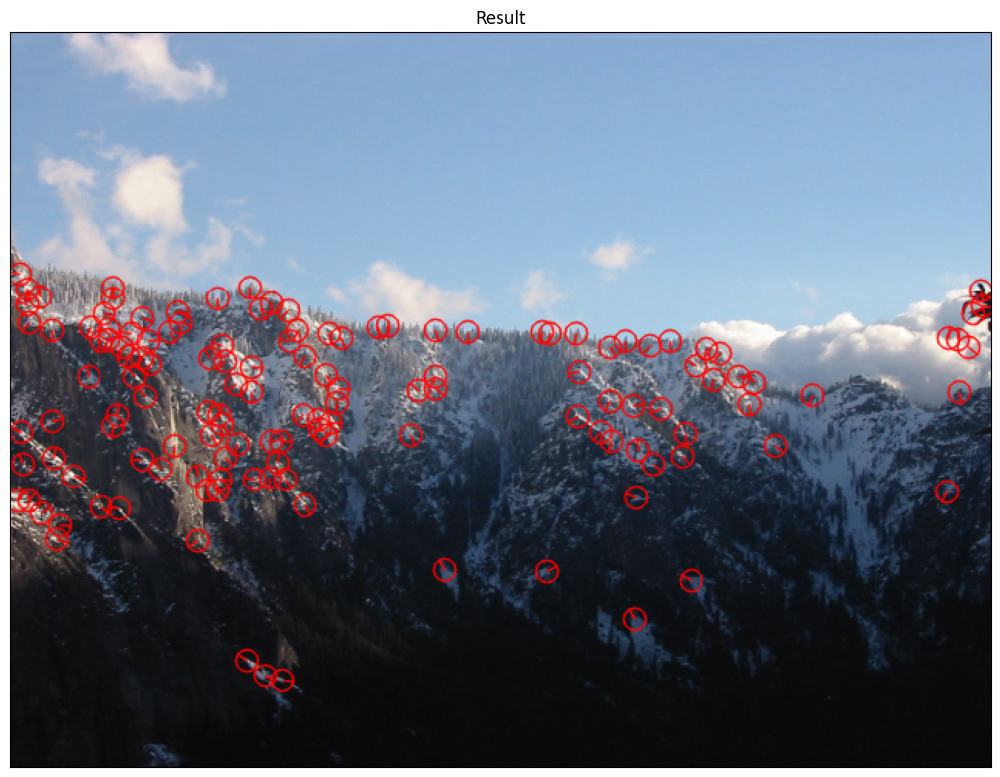

In [17]:
from skimage.feature import corner_peaks
img=readIm(get_image('yosemite7.jpg'),1)

image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(float)

sigmaD = 1.5
sigmaI = 2.25

min_distance = 3
threshold = 0.09

size = 2 * 3 * sigmaI + 1

dx, dy = derivatives(image, sigmaD)

harrisMap = HarrisMap(dx, dy, sigmaI)
displayIm(harrisMap, title='Harris map',factor= 2)


coord, values = NonMaximaSuppression(harrisMap, min_distance, threshold)
theta = orientation(dx, dy)
keypoints = keyPoints(coord, theta, size)

print("Total number of keypoints:", len(keypoints))

image_uint8 = (img).astype(np.uint8)
# (255, 0, 0),
cv2.drawKeypoints(image_uint8, keypoints, image_uint8, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS+cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG)

displayIm(image_uint8, title='Result',factor= 2)

Podemos ver que es bastante bueno a la hora de encontrar esquinas pero hay que decir que no es tan robusto como imaginaba ya que en comparación a la plantilla original hay ciertos puntos que incluso tienen diferente orientación (aunque la mayoría si que son exactamente iguales). También hay que decir que debido a la naturaleza del algoritmo no mantiene muy uniformes los puntos sobre la imagen y tienden a agruparse en las zonas donde la superficie es más "esquinada" o hay más "bordes". (Me refiero a donde hay mas "rocosidad", donde hay varias pendientes o la montaña se mete para adentro luego sale etc.)

También decir que en el caso de mostrar la imagen thresholded es diferente a la de la plantilla original ya que en la plantilla original una vez se tiene el mapa de Harris se aplica un threshold a "mano" donde lo que te quedas son las zonas de alto contraste y una vez ya con eso lo que haces es aplicar corner_peaks. Yo debido a que corner_peaks tiene un parámetro "threshold" lo que hice es aplicar ese threshold a partir de la función de corner_peaks y luego muestro la imagen por eso es que solo se ven puntitos blancos en la imagen (aunque cuesta verlos se encuentran ahí).

# <font color='blue'>**Exercise 3:** Matching keypoints between images using SIFT and Haralick descriptors (2 points)

<font color='blue'>Write the Python code necessary to compute the matching between points from two images. To do so, you have to apply the SIFT algorithm to both images in order to extract keypoints and descriptors (see https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Then, we use the Brute-Force cross-check criterion (`cv2.BFMatcher`) and Lowe's ratio distance criterion (`knnMatch`) to compute the matches and draw the best 100 matches using the function `cv2.drawMatches`.

En este ejercicio lo que haremos será implementar SIFT para ver como funciona y después también probaremos el descriptor de texturas Haralick para ver como funciona respecto de SIFT.

En primer lugar debemos seguir el tutorial que se nos ha pasado el enlace y podremos ir copiando las funciones que se usan para proceder con el ejercicio. En este caso usaremos sift tanto como detector como descriptor y los matches los comprobaremos y buscaremos de dos formas diferentes por fuerza bruta y con 2nn.

No hay mucha pérdida aqui ya que simplemente tenemos dos imagenes, para ambas llamaremos a la función siftPoints que nos devolverá los keypoints y sus descriptores. Una vez con esto lo que haremos será hacerle matching a los puntos con fuerza bruta o 2nn segun elijamos y devolveremos los puntos que hicieron match de esta forma a la hora de hacer el plot podemos mostrarlos.

In [18]:
# this function computes KeyPoints and descriptors in an image using SIFT
def siftPoints(im,nfeatures=5000):
    sift = cv2.SIFT_create(nfeatures=nfeatures)
    kp, ds = sift.detectAndCompute(im, None)
    return kp,ds

In [19]:

# Esta función muestra los Keypoints de una imagen con escala y orientación
def showKP(im, kp, title):
    img = cv2.drawKeypoints(im, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    displayIm(img, title, 1)

# This function display the matches between two images
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches'):
  im1 = cv2.drawKeypoints(im1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  im2 = cv2.drawKeypoints(im2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  imBF=cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  displayIm(imBF,title,2)


#This function compute matches between descriptors of two images
def matching(ds1,ds2,FlagMode='BF'):
  if FlagMode == 'BF':
        bf = cv2.BFMatcher()
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key = lambda x:x.distance)
        return matches
  elif FlagMode == 'KNN':
      bf = cv2.BFMatcher(crossCheck=False)
      matches = bf.knnMatch(ds1, ds2, k=2)
      good = []
      for m,n in matches:
          if m.distance < 0.75*n.distance:
              good.append(m)

      good = sorted(good, key = lambda x:x.distance)
      return good
  else:
      print('Error in Matching mode')


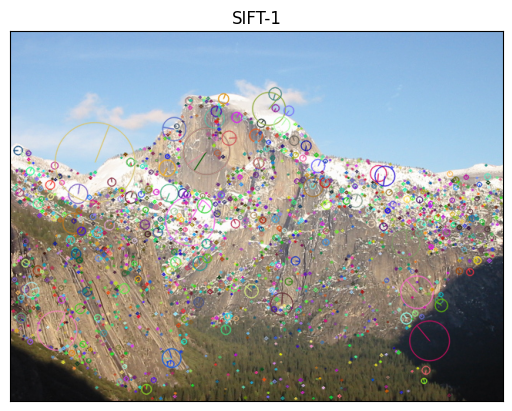

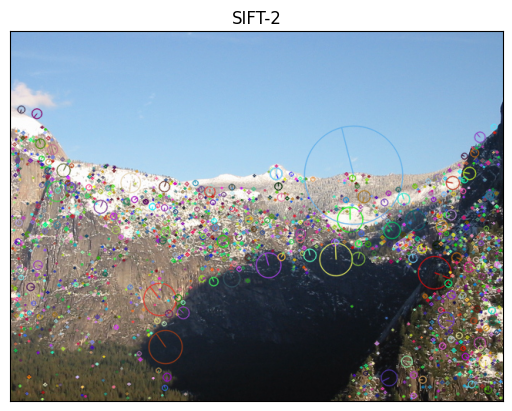

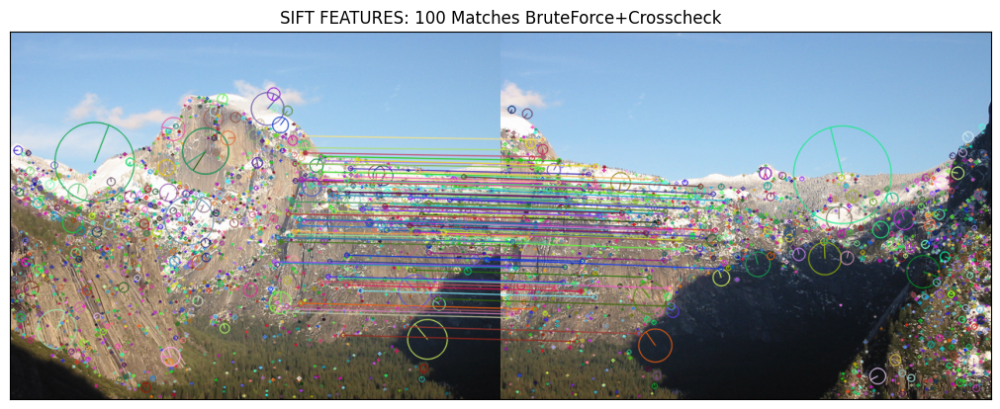

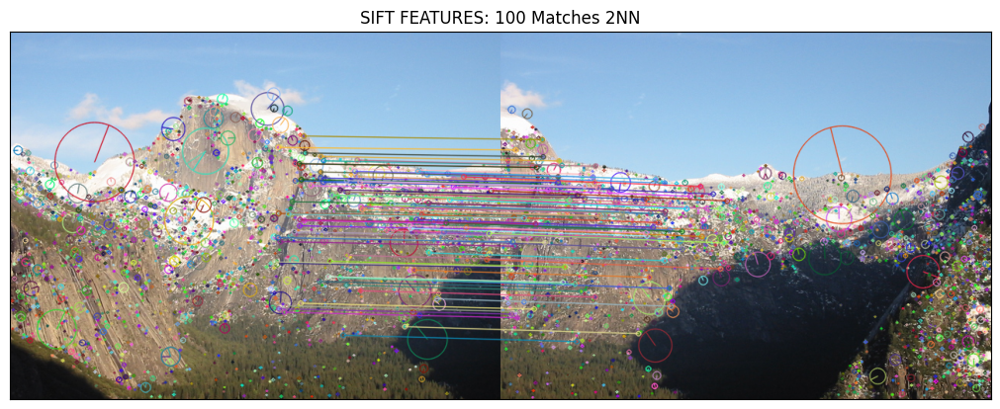

In [20]:
img1=readIm(get_image('yosemite2.jpg'),1) #
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=readIm(get_image('yosemite3.jpg'),1) #
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

showKP(img1, kp1, 'SIFT-1')
showKP(img2, kp2, 'SIFT-2')


matches = matching(ds1, ds2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches, 100, title='SIFT FEATURES: 100 Matches BruteForce+Crosscheck')

matches = matching(ds1, ds2, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches, 100, title='SIFT FEATURES: 100 Matches 2NN')

**Ventajas de SIFT**:

* Invariancia a la escala y la rotación: Una de las principales ventajas de SIFT es su capacidad para ser invariante a la escala y la rotación. Esto significa que puede detectar y emparejar características incluso si las imágenes han sido escaladas o rotadas.

* Robustez ante cambios en la iluminación y el contraste: SIFT es relativamente robusto ante variaciones en la iluminación y el contraste, lo que lo hace adecuado para aplicaciones en entornos con condiciones de iluminación cambiantes.

* Detección de puntos clave distintivos: SIFT identifica puntos clave o características distintivas en una imagen, lo que facilita la correspondencia entre diferentes vistas de una escena.

* Repeatabilidad: Los puntos clave detectados por SIFT tienden a ser repetibles, lo que significa que pueden ser detectados en diferentes imágenes de la misma escena.

* Buena capacidad de discriminación: SIFT utiliza un descriptor robusto para cada punto clave, que codifica información local alrededor del punto clave. Esto proporciona una buena capacidad de discriminación entre puntos clave. (Funciona con la orientacion del gradiente)

**Desventajas de SIFT**:

* Computacionalmente costoso: SIFT puede ser computacionalmente costoso, especialmente en comparación con algoritmos más simples. Esto puede ser una desventaja en aplicaciones en tiempo real o en entornos con recursos limitados.

* Sensibilidad a cambios de vista significativos: SIFT puede tener dificultades cuando hay cambios de vista significativos entre imágenes, ya que las características detectadas pueden no ser lo suficientemente consistentes.

* Tamaño del descriptor: Los descriptores SIFT son relativamente grandes, lo que puede ser una consideración importante en aplicaciones con limitaciones de memoria o almacenamiento.

A pesar de estas desventajas, SIFT sigue siendo ampliamente utilizado y ha sido la base para muchos desarrollos y mejoras en la detección y descripción de características en imágenes.

También podemos mencionar ciertas caracteristicas en base a la forma de hacer matching:

* Matching con k-NN (k-Nearest Neighbors):
Selección de Vecinos Cercanos: En el matching con k-NN, para cada punto clave en el conjunto de características de una imagen, se buscan los k puntos clave más cercanos en el conjunto de características de la otra imagen. K es un parámetro que se puede ajustar.
 * Mejora de Robustez: La idea detrás de k-NN es proporcionar una medida más robusta de correspondencia al considerar múltiples vecinos en lugar de simplemente el vecino más cercano. Esto ayuda a manejar situaciones donde podría haber ambigüedad en la correspondencia.

 * Ajuste del umbral: El número de vecinos (k) se puede ajustar para controlar la sensibilidad del algoritmo. Un valor mayor de k podría ser útil en presencia de ruido o características ambiguas, pero también podría aumentar el riesgo de correspondencias incorrectas.

* Matching con Brute Force:
Comparación Exhaustiva: En el matching con Brute Force, cada punto clave en el conjunto de características de una imagen se compara con todos los puntos clave en el conjunto de características de la otra imagen.

 * Simplicidad: Brute Force es más simple de entender e implementar. No involucra estrategias más avanzadas como la estructura de árbol o técnicas de vecinos más cercanos.

 * Menos Eficiente: La principal desventaja de Brute Force es que puede ser menos eficiente computacionalmente, especialmente cuando hay un gran número de puntos clave.

En general, Brute Force puede ser más lento, especialmente a medida que el tamaño de los conjuntos de características aumenta. El matching con k-NN puede ser más eficiente al considerar solo los k vecinos más cercanos en lugar de todos los puntos clave. Además k-NN tiende a ser más robusto en situaciones donde puede haber correspondencias ambiguas, pero el ajuste del parámetro k es crítico. Brute Force podría ser suficiente en casos simples con pocos puntos clave.

<font color='blue'>Now, we have to perform exactly the same operation, but employing Haralick features. To do so, we are going to create a small window ($7\times7$ pixels) centered around the SIFT keypoint detected, and we are going to use `mahotas` library to compute those texture-based descriptors.

In [21]:
!pip install mahotas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 17.9 MB/s eta 0:00:00


A continuación haremos lo mismo que de la forma anterior solo que ahora no usaremos SIFT como descriptor sino solo como detector y usaremos Haralick como descriptor de los puntos detectados por SIFT. Para ello debemos de extraer una ventana de 7x7 píxeles alrededor del keypoint y hacer Haralick

In [22]:
import mahotas

def computeHaralick(im, keypoints=None, window_size = 7):

    if not keypoints:
        return mahotas.features.haralick(im)

    windows = []
    half_size = window_size // 2
    for kp in keypoints:
      x, y = np.int0(kp.pt)
      window = im[y - half_size // 2:y + half_size // 2 + 1, x - half_size // 2:x + half_size // 2 + 1]
      if window.size != 0:
        windows.append(window)

    ds = [mahotas.features.haralick(window).mean(axis=0) for window in windows]

    return ds




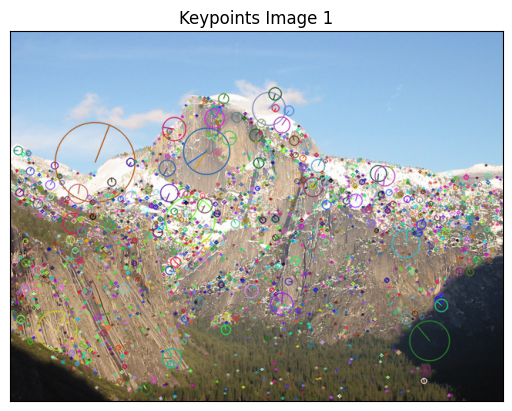

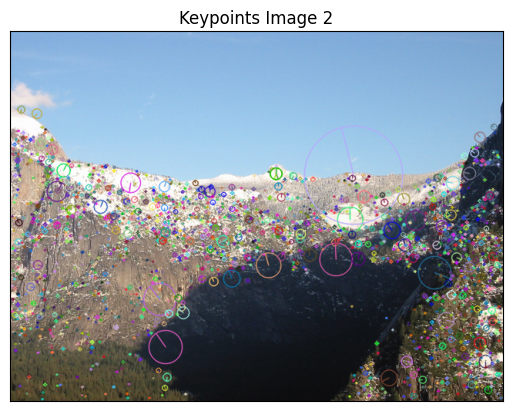

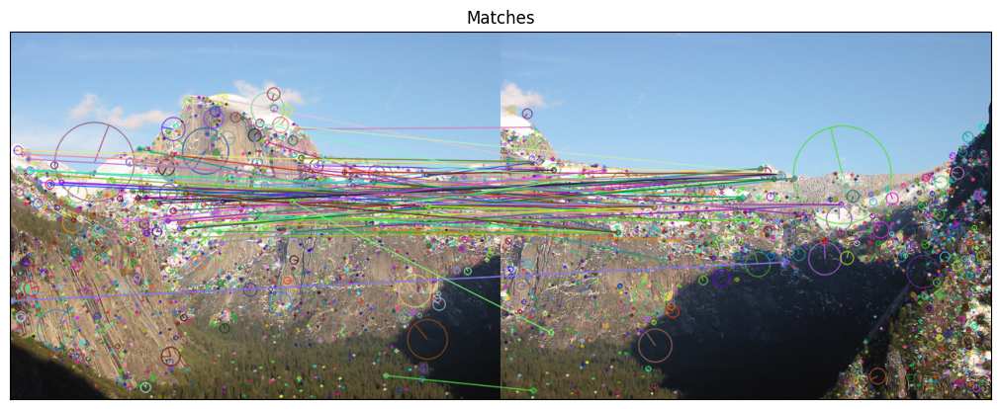

In [23]:
img1 = readIm(get_image('yosemite2.jpg'), 1)
im1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img2 = readIm(get_image('yosemite3.jpg'), 1)
im2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

# Compute SIFT keypoints and descriptors with Haralick features
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

dsh1 = np.array(computeHaralick(im1, kp1), np.float32)
dsh2 = np.array(computeHaralick(im2, kp2), np.float32)

# Display keypoints and descriptors
showKP(img1, kp1, 'Keypoints Image 1')
showKP(img2, kp2, 'Keypoints Image 2')

# Perform matching using the modified descriptors
matches = matching(dsh1, dsh2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches, 100, title='Matches')

Una vez hecho esto podemos ver que el resultado es bastante malo. Esto es debido a que Haralick es un descriptor de texturas y en estas imagenes de montañas todos los puntos son muy similares con pendientes similares y donde puede dar lugar a confusion el descriptor en ciertos puntos (ya que hay varias pendientes nevadas que es muy similar a otro ya que todo sería blanco)

**Ventajas**:
* Robustez a la Iluminación:
Haralick es relativamente robusto a cambios en la iluminación porque se centra en patrones relativos de intensidades de píxeles, en lugar de en los valores absolutos.

* Información sobre Texturas: Proporciona información detallada sobre las texturas presentes en una imagen, lo que puede ser valioso en aplicaciones de clasificación y reconocimiento de objetos.

* Invarianza a la Rotación y Escala: Algunas características derivadas de la matriz de co-ocurrencia pueden ser invariantes a ciertos tipos de transformaciones geométricas, como rotaciones y escalas.

**Desventajas**:

* Sensibilidad a Ruido: La matriz de co-ocurrencia puede ser sensible al ruido presente en la imagen, lo que puede afectar negativamente la calidad de las características extraídas.

* Alta Dimensionalidad: Las características extraídas mediante Haralick tienden a tener una alta dimensionalidad, lo que puede ser problemático en términos de almacenamiento y procesamiento, especialmente en conjuntos de datos grandes.

* Dependencia del Tamaño de la Región de Interés: Los resultados de Haralick pueden depender del tamaño de la región de interés utilizada para calcular la matriz de co-ocurrencia. La elección del tamaño de la ventana puede afectar la sensibilidad de las características.


Siendo este ultimo punto la principal desventaja que vemos aquí ya que la ventana al ser muy pequeña puede que este capturando solo el blanco de la nieve y que sea complicado el hecho de diferenciar ese puntos de otros similares.

<font color='blue'> Which feature descriptor seems to be more suitable for keypoint matching? Why?

Claramente el más adecuado de los descriptores es SIFT por todo lo mencionado anteriormente sobre ambos. En todos los sentidos es mejor en este problema. En este problema al tener imagenes montañosas con nieve donde se pueden llegar a confundir los puntos a la hora de calcular Haralick vemos que el comportamiento de SIFT es mucho mejor por todo lo que conlleva no ser un descriptor de texturas. Esto no quiere decir que Haralick sea malo. Quizás con una ventana mayor (aunque el coste computacional sea mayor tambien) tenga un comportamiento mucho mejor del que ha desmostrado.

# <font color='blue'>**Exercise 4:** Image Stitching using Homographies (3 points)

<font color='blue'>Now we are going to compute homographies between images, and use them to build a mosaic/panorama. To calculate the homography between two images, call the function `cv2.findHomography()`, which takes as input the lists of KeyPoints and the matches found between them. Use RANSAC to perform a robust estimation.

In [24]:
def homography(im1, im2, Ransac_Error,MIN_MATCH_COUNT=20):

  kpts1, desc1 = siftPoints(im1)
  kpts2, desc2 = siftPoints(im2)

  matches = matching(desc1, desc2, FlagMode='KNN')

  src_pts = np.array([kpts1[m.queryIdx].pt for m in matches])
  dst_pts = np.array([kpts2[m.trainIdx].pt for m in matches])

  if len(matches) > MIN_MATCH_COUNT:
      H = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, Ransac_Error)[0]
      return H
  else:
      return None


<font color='blue'>To compose the mosaic we need to provide the following information:

> <font color='blue'>a) Maximum size of the canvas according to the number of images to be stitched and their dimensions.

> <font color='blue'>b) The central image that will give the axes to the mosaic.

> <font color='blue'>c) The order of each image with respect to the central one (i.e., we know the position of each image in the burst of images taken).

> <font color='blue'>d) The homography to copy the central image into the canvas.

<font color='blue'>Now, once all the aforementioned decisions have been made, we need to proceed as follows:
> <font color='blue'>a) Read the images from left to right.

> <font color='blue'>b) Set one central image as the reference to create the panorama. This one will provide the axes to the canvas.

> <font color='blue'>c) Compute the homography between each two consecutive images in your list.

> <font color='blue'>d) Set the canvas and the reference homography.

> <font color='blue'>e) Compute the homography between each image and the canvas.

> <font color='blue'>f) Use the computed homographies to transport the images to the canvas. Use the function `cv2. warpPerspective()`.

> <font color='blue'>g) Remove the black regions from the canvas to improve quality.



La homografía es una transformación geométrica que describe la proyección perspectiva entre dos imágenes. Puede ser utilizada para relacionar puntos correspondientes en imágenes de una escena tomadas desde diferentes perspectivas. La homografía se representa por una matriz 3x3.

La homografía se puede calcular mediante métodos de estimación de puntos correspondientes. Uno de los métodos más comunes es el método de RANSAC (Random Sample Consensus) que será el que usaremos aqui.

En primer lugar debemos de calcular la homografía entre dos imagenes consecutivas y una vez con estas calcularemos las homografia con respecto de la imagen central con la funcion mosaicHomographies. A partir de aqui todo es sencillo ya que simplemente debemos de pintar las imagenes en el canvas desde afuera hacia adentro poniendo en primer lugar las imagenes que mas transformaciones sufren y dejando para el final las que menos. En mi caso pongo la imagen central como ultima. También a la hora de calcular la homografia de la imagen respecto de la central tenemos que tener cuidado ya que en una parte (antes o despues de la imagen central segun de la forma en la que lo calculemos) habra que hacer la inversa de esa matriz.

In [25]:
def computeLocalHomographies(images,method='KNN', Ransac_Error=5.0):
  H_list = []

  for i in range(len(images)-1):
  # Obtenemos las homografías para las imágenes dos a dos
    H = homography(images[i+1], images[i], Ransac_Error)
    H_list.append(H)

  return H_list


def mosaicHomographies(H,idx, H0):
  H_mosaic = []

  H_mosaic.append(H0)

  for i in range(len(H) - idx):
    H_mosaic.append(np.dot(H_mosaic[i], H[i + idx]))


  H_m_r = []
  H_m_r.append(H0)
  H_s = H[:idx][::-1]
  for i in range(idx):
    H_m_r.append(np.dot(H_m_r[i], np.linalg.inv(H_s[i])))
  H_m_r = H_m_r[::-1][:-1]


  H_m_r.extend(H_mosaic)
  return H_m_r

def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2
  return H


In [26]:
# Auxiliary functions

def setCanvas(row,col,flagColor,nim=2):
  return np.zeros((row, col), flagColor)

def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]


In [27]:
def composeMosaic(images,canvas,H_mosaic,idxc):
    rows = canvas.shape[0]
    cols = canvas.shape[1]


    for i in range(idxc):
      canvas = cv2.warpPerspective(images[i], H_mosaic[i], (width, height), \
                              dst=canvas, borderMode=cv2.BORDER_TRANSPARENT)

    for i in range(len(H_mosaic) - 1, idxc-1, -1):
        canvas = cv2.warpPerspective(images[i], H_mosaic[i], (width, height), \
                                 dst=canvas, borderMode=cv2.BORDER_TRANSPARENT)
      #displayIm(canvas, 'a'+str(i), 2)
    canvas = cv2.warpPerspective(images[idxc], H_mosaic[idxc], (width, height), dst=canvas, borderMode=cv2.BORDER_TRANSPARENT)

    displayIm(canvas, 'Mosaic', 2)
    return canvas


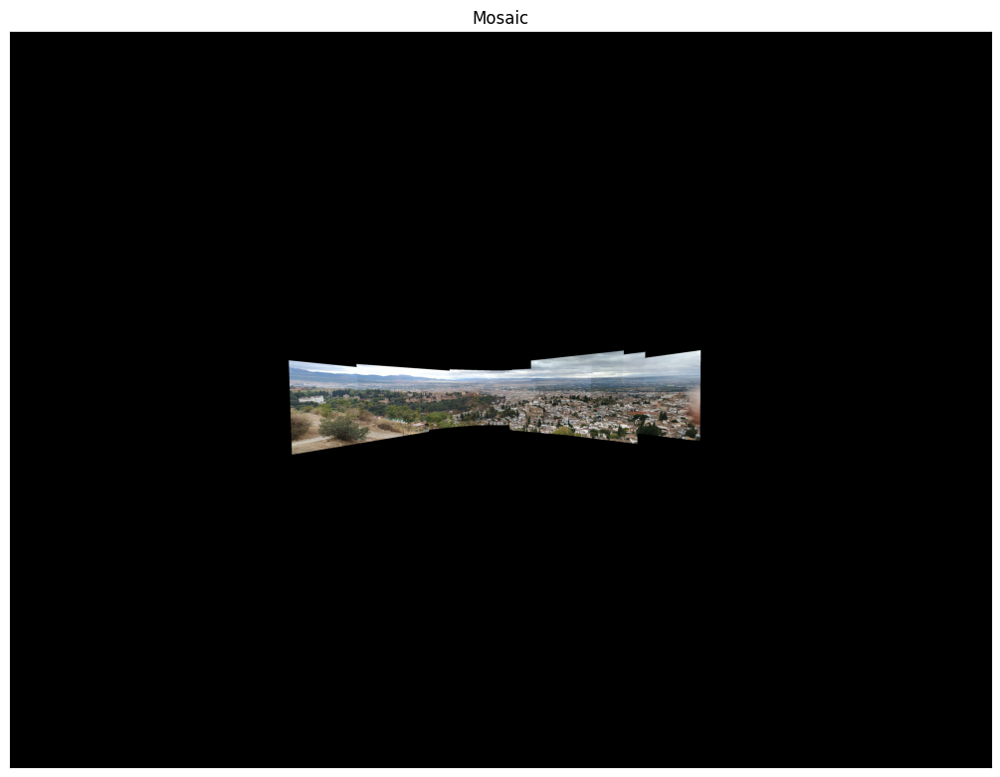

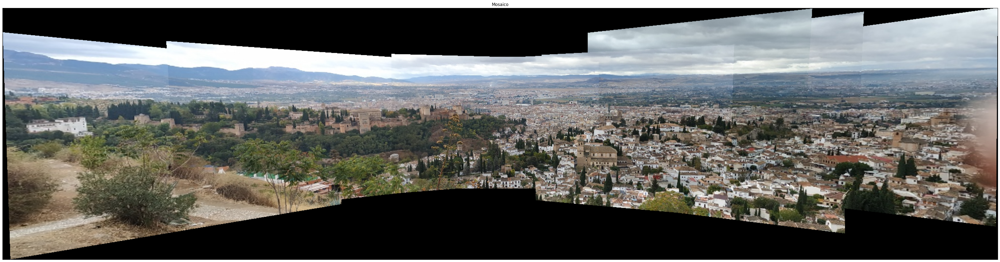

In [28]:
images=[]
PREFIX='IMG_20211030_1104'
DIR=''

nameImages=['10_S.jpg','13_S.jpg','15_S.jpg','17_S.jpg','18_S.jpg','20_S.jpg','21_S.jpg', '25_S.jpg','26_S.jpg', '28_S.jpg','31_S.jpg','33_S.jpg','34_S.jpg','36_S.jpg']

for item in nameImages:
  images.append(readIm(get_image(PREFIX+item),flagColor=1))


height = sum([im.shape[0] for im in images])
width = sum([im.shape[1] for im in images])
canvas = np.zeros((height, width, 3), dtype=np.uint8)
idxc = 5
H0 = axesHomography(images[idxc].shape, canvas.shape)
H = computeLocalHomographies(images)

H_mosaic = mosaicHomographies(H, idxc, H0 )
mosaic = composeMosaic(images, canvas, H_mosaic, idxc)
displayIm(blackOut(mosaic), 'Mosaico', 8)
